In [40]:
# Cell 0 — Install (Colab only, skip if already installed)
# !pip install librosa soundfile numpy pandas matplotlib scikit-learn umap-learn hdbscan openl3

# Cell 1 — Imports
# Cell 1 — Imports and helper functions

import soundfile as sf
from scipy.stats import iqr
from IPython.display import Audio, display

import os, math, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa, librosa.display
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import umap
import hdbscan     # optional alternative to GMM
# openl3 optional
try:
    import openl3
    OPENL3_OK = True
except Exception:
    OPENL3_OK = False

plt.rcParams['figure.figsize'] = (12, 4)


In [41]:
AUDIO_PATH = "music/Thangapoovey.mp3"

SR = 22050

y, sr = librosa.load(AUDIO_PATH, sr=SR, mono=True)
duration = librosa.get_duration(y=y, sr=sr)
print(f"Loaded: {AUDIO_PATH}  — duration: {duration:.2f}s, sr: {sr}, samples: {y.shape[0]}")

display(Audio(y, rate=sr))

[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?


Loaded: music/Thangapoovey.mp3  — duration: 235.52s, sr: 22050, samples: 5193216


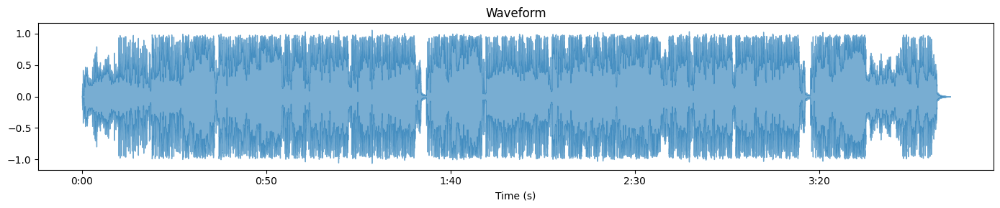

In [42]:
plt.figure(figsize=(14,3))
librosa.display.waveshow(y, sr=sr, alpha=0.6)
plt.title("Waveform")
plt.xlabel("Time (s)")
plt.tight_layout()
plt.show()

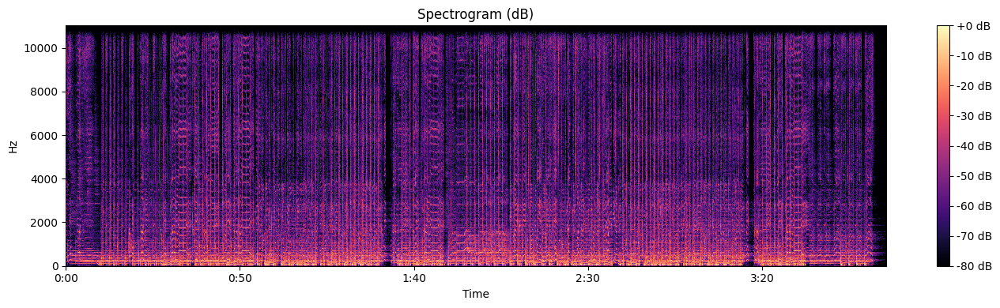

In [43]:
n_fft = 2048
hop_length = 512

D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14,4))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz', hop_length=hop_length)
plt.colorbar(format="%+2.f dB")
plt.title("Spectrogram (dB)")
plt.tight_layout()
plt.show()

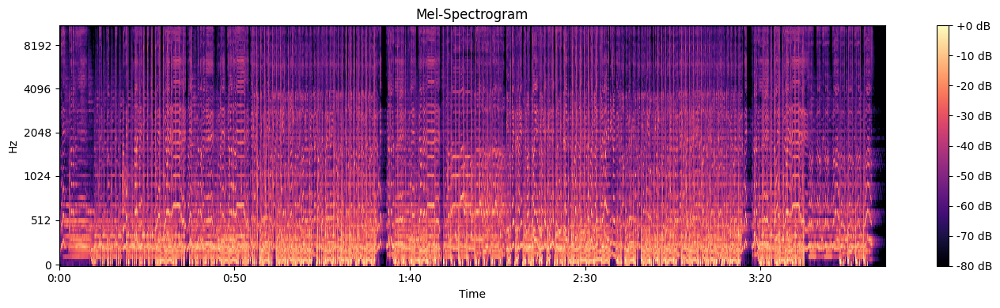

In [44]:
mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, n_fft=n_fft, hop_length=hop_length)
mel_db = librosa.power_to_db(mel, ref=np.max)

plt.figure(figsize=(14,4))
librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel', hop_length=hop_length)
plt.colorbar(format="%+2.f dB")
plt.title("Mel-Spectrogram")
plt.tight_layout()
plt.show()

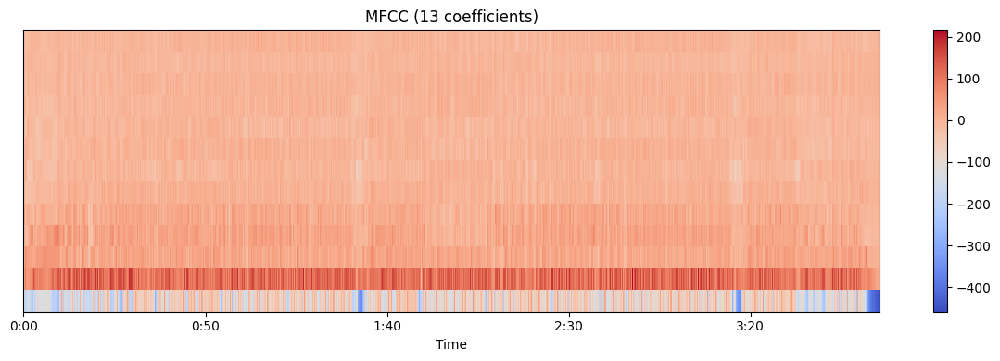

In [45]:
mfcc = librosa.feature.mfcc(S=librosa.power_to_db(mel), n_mfcc=13)
plt.figure(figsize=(12,4))
librosa.display.specshow(mfcc, x_axis='time', sr=sr, hop_length=hop_length)
plt.colorbar()
plt.title("MFCC (13 coefficients)")
plt.tight_layout()
plt.show()

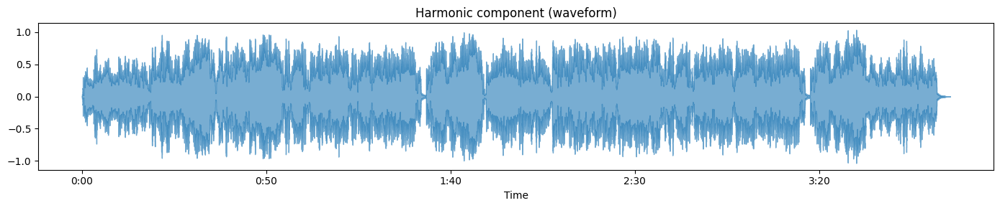

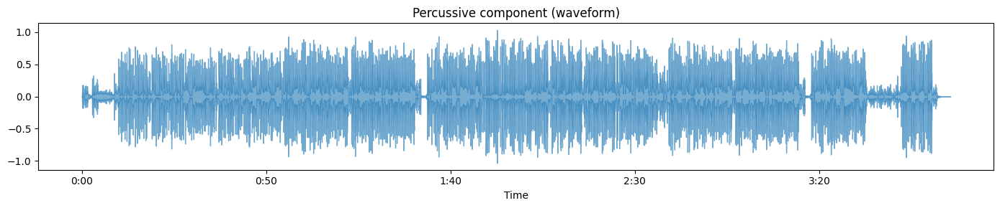

In [46]:
y_harm, y_perc = librosa.effects.hpss(y)

plt.figure(figsize=(14,3))
librosa.display.waveshow(y_harm, sr=sr, alpha=0.6)
plt.title("Harmonic component (waveform)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14,3))
librosa.display.waveshow(y_perc, sr=sr, alpha=0.6)
plt.title("Percussive component (waveform)")
plt.tight_layout()
plt.show()

/var/folders/h2/kf_pzj817vz_fh6wbvz8kygh0000gn/T/ipykernel_28461/3655868716.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Estimated tempo (BPM): {float(tempo):.2f}")


Estimated tempo (BPM): 107.67
Detected 408 beat frames (first 10 beat times): [0.11609977 0.67337868 1.2306576  1.76471655 2.32199546 2.85605442
 3.41333333 3.94739229 4.52789116 5.06195011]


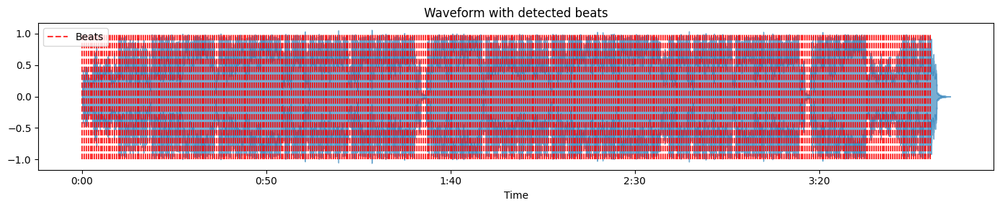

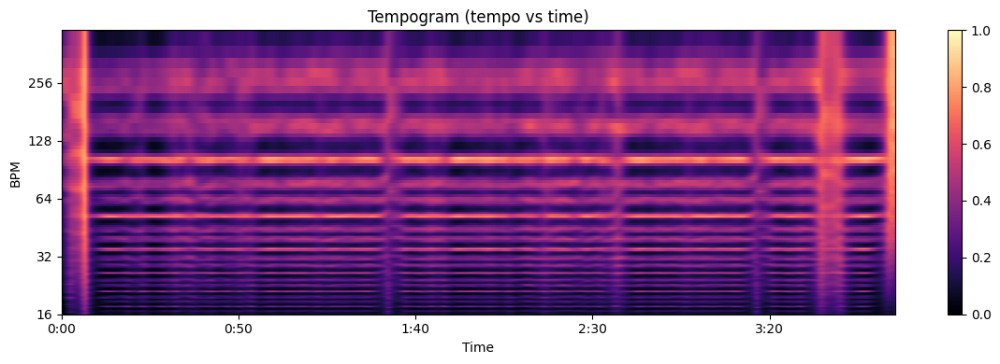

In [47]:
onset_env = librosa.onset.onset_strength(y=y_perc, sr=sr, hop_length=hop_length)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=hop_length)
print(f"Estimated tempo (BPM): {float(tempo):.2f}")
print(f"Detected {len(beats)} beat frames (first 10 beat times): {beat_times[:10]}")

plt.figure(figsize=(14,3))
librosa.display.waveshow(y, sr=sr, alpha=0.6)
plt.vlines(beat_times, -1.0, 1.0, color='r', alpha=0.8, linestyle='--', label='Beats')
plt.title("Waveform with detected beats")
plt.legend()
plt.tight_layout()
plt.show()

tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
plt.figure(figsize=(12,4))
librosa.display.specshow(tempogram, sr=sr, x_axis='time', y_axis='tempo', hop_length=hop_length)
plt.colorbar()
plt.title("Tempogram (tempo vs time)")
plt.tight_layout()
plt.show()

IBI mean: 0.565s, std: 0.013s, rhythm_stability (raw): 77.131


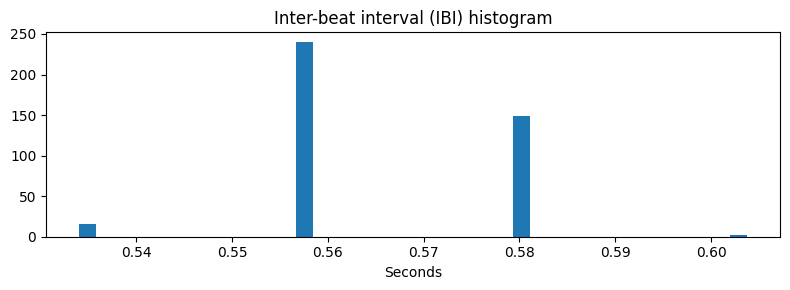

In [48]:
if len(beat_times) > 1:
    ibi = np.diff(beat_times)
    ibi_mean = np.mean(ibi)
    ibi_std = np.std(ibi)
    rhythm_stability = 1.0 / (ibi_std + 1e-8)
    print(f"IBI mean: {ibi_mean:.3f}s, std: {ibi_std:.3f}s, rhythm_stability (raw): {rhythm_stability:.3f}")

    plt.figure(figsize=(8,3))
    plt.hist(ibi, bins=40)
    plt.title("Inter-beat interval (IBI) histogram")
    plt.xlabel("Seconds")
    plt.tight_layout()
    plt.show()
else:
    print("Not enough beats detected to compute IBI stats.")


In [49]:
def compute_danceability_from_audio(y, sr, hop_length=512):
    y_harm, y_perc = librosa.effects.hpss(y)
    onset_env = librosa.onset.onset_strength(y=y_perc, sr=sr, hop_length=hop_length)

    beat_strength = np.mean(onset_env) / (np.max(onset_env) + 1e-8)
    tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
    beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=hop_length)

    if len(beat_times) > 2:
        ibi = np.diff(beat_times)
        rhythm_stability = 1.0 / (np.std(ibi) + 1e-8)

        rhythm_stability = min(rhythm_stability / 5.0, 1.0)
    else:
        rhythm_stability = 0.0

    ideal_min, ideal_max = 100, 130
    if tempo <= 0:
        tempo_suitability = 0.0
    elif tempo < ideal_min:
        tempo_suitability = tempo / ideal_min
    elif tempo > ideal_max:
        tempo_suitability = ideal_max / tempo
    else:
        tempo_suitability = 1.0

    rms = librosa.feature.rms(y=y_perc, hop_length=hop_length)[0]
    energy_pulse = (np.std(rms) / (np.mean(rms) + 1e-8))
    energy_pulse = float(np.clip(energy_pulse, 0, 1))

    danceability = (0.35 * float(np.clip(beat_strength, 0, 1))
                    + 0.25 * float(np.clip(tempo_suitability, 0, 1))
                    + 0.20 * float(np.clip(rhythm_stability, 0, 1))
                    + 0.20 * float(np.clip(energy_pulse, 0, 1)))
    danceability = float(np.clip(danceability, 0, 1))
    return {
        "danceability": danceability,
        "beat_strength": float(np.clip(beat_strength, 0, 1)),
        "tempo": float(tempo),
        "tempo_suitability": float(np.clip(tempo_suitability, 0, 1)),
        "rhythm_stability": float(np.clip(rhythm_stability, 0, 1)),
        "energy_pulse": energy_pulse
    }


In [50]:

dance_feats = compute_danceability_from_audio(y, sr, hop_length=hop_length)
dance_feats

/var/folders/h2/kf_pzj817vz_fh6wbvz8kygh0000gn/T/ipykernel_28461/236115977.py:39: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  "tempo": float(tempo),


{'danceability': 0.6408813077956439,
 'beat_strength': 0.10901954025030136,
 'tempo': 107.666015625,
 'tempo_suitability': 1.0,
 'rhythm_stability': 1.0,
 'energy_pulse': 0.7636223435401917}

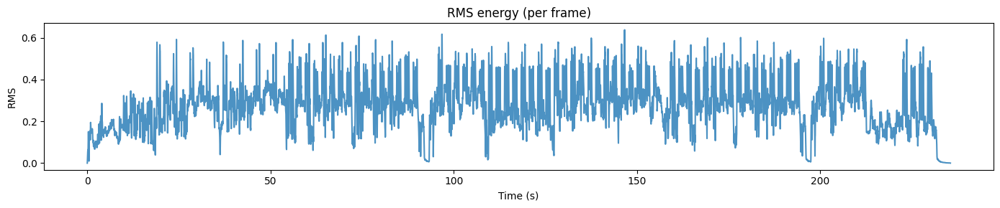

RMS mean: 0.278816, RMS std: 0.113234
Dynamic range (dB, approximate): 73.89 dB


In [51]:
rms = librosa.feature.rms(y=y, hop_length=hop_length)[0]
rms_times = librosa.frames_to_time(np.arange(len(rms)), sr=sr, hop_length=hop_length)
plt.figure(figsize=(14,3))
plt.plot(rms_times, rms, alpha=0.8)
plt.title("RMS energy (per frame)")
plt.xlabel("Time (s)")
plt.ylabel("RMS")
plt.tight_layout()
plt.show()

loudness_db = librosa.power_to_db(rms**2, ref=np.max)
print(f"RMS mean: {np.mean(rms):.6f}, RMS std: {np.std(rms):.6f}")
dynamic_range = 20 * np.log10(np.max(rms) / (np.min(rms)+1e-12))
print(f"Dynamic range (dB, approximate): {dynamic_range:.2f} dB")


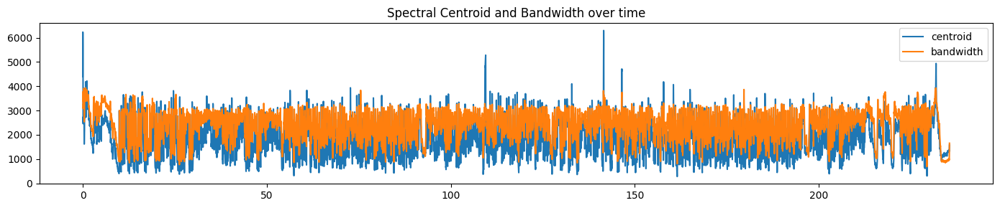

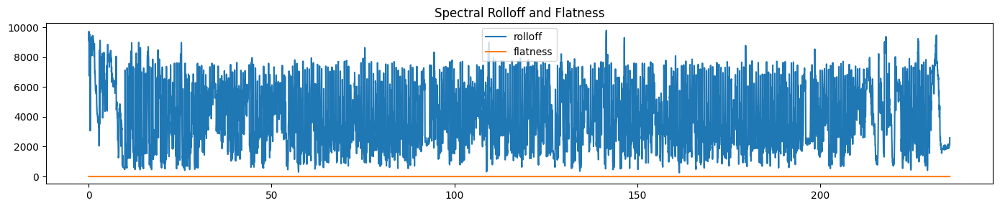

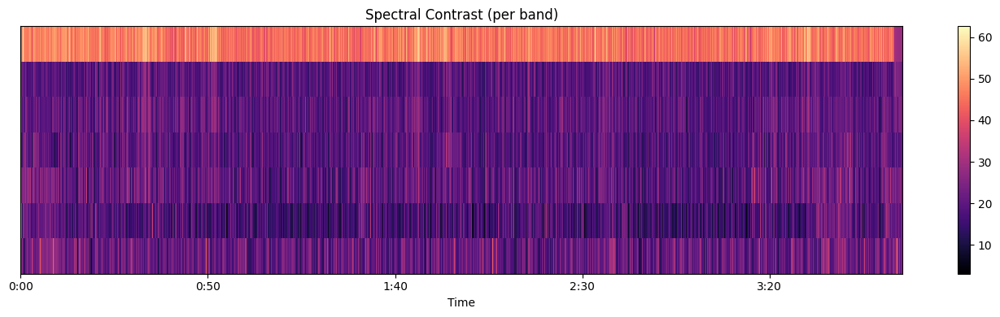

In [52]:
centroid = librosa.feature.spectral_centroid(y=y, sr=sr, hop_length=hop_length)[0]
bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr, hop_length=hop_length)[0]
rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, hop_length=hop_length)[0]
flatness = librosa.feature.spectral_flatness(y=y, hop_length=hop_length)[0]
contrast = librosa.feature.spectral_contrast(y=y, sr=sr, hop_length=hop_length)

times = librosa.frames_to_time(np.arange(len(centroid)), sr=sr, hop_length=hop_length)

plt.figure(figsize=(14,3))
plt.plot(times, centroid, label="centroid")
plt.plot(times, bandwidth, label="bandwidth")
plt.legend()
plt.title("Spectral Centroid and Bandwidth over time")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14,3))
plt.plot(times, rolloff, label="rolloff")
plt.plot(times, flatness, label="flatness")
plt.legend()
plt.title("Spectral Rolloff and Flatness")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14,4))
librosa.display.specshow(contrast, sr=sr, x_axis='time', hop_length=hop_length)
plt.colorbar()
plt.title("Spectral Contrast (per band)")
plt.tight_layout()
plt.show()


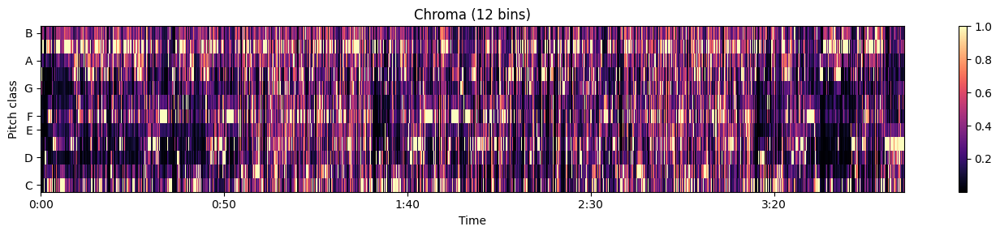

Estimated predominant pitch class: A#


In [53]:
chroma = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)
plt.figure(figsize=(14,3))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length)
plt.colorbar()
plt.title("Chroma (12 bins)")
plt.tight_layout()
plt.show()

chromagram_mean = np.mean(chroma, axis=1)
notes = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
key_idx = chromagram_mean.argmax()
estimated_key = notes[key_idx]
print(f"Estimated predominant pitch class: {estimated_key}")


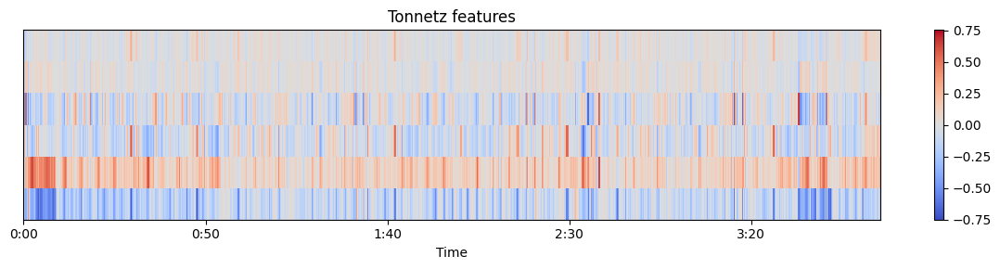

In [54]:
tonnetz = librosa.feature.tonnetz(y=librosa.effects.harmonic(y), sr=sr)
plt.figure(figsize=(12,3))
librosa.display.specshow(tonnetz, x_axis='time', sr=sr, hop_length=hop_length)
plt.colorbar()
plt.title("Tonnetz features")
plt.tight_layout()
plt.show()

In [55]:
harmonic_energy = np.sum(np.abs(librosa.stft(y_harm)), axis=None)
total_energy = np.sum(np.abs(librosa.stft(y)), axis=None)
harmonic_ratio = harmonic_energy / (total_energy + 1e-12)

print(f"Harmonic energy ratio (proxy): {harmonic_ratio:.3f}")

print("For robust vocal/speech detection use YAMNet or a vocal classifier on mel-spectrograms (optional).")

Harmonic energy ratio (proxy): 0.571
For robust vocal/speech detection use YAMNet or a vocal classifier on mel-spectrograms (optional).


In [56]:
centroid_mean = np.mean(centroid)
centroid_norm = centroid_mean / (sr/2) 
root = key_idx
major_indices = [(root + i) % 12 for i in [0,4,7]]
minor_indices = [(root + i) % 12 for i in [0,3,7]]
major_energy = chromagram_mean[major_indices].sum()
minor_energy = chromagram_mean[minor_indices].sum()
triad_score = (major_energy - minor_energy) / (major_energy + minor_energy + 1e-12)

valence_proxy = 0.6 * centroid_norm + 0.4 * np.clip((triad_score + 1) / 2, 0, 1)  # scale to [0,1]
valence_proxy = float(np.clip(valence_proxy, 0, 1))
print(f"Valence proxy (0..1): {valence_proxy:.3f}  (centroid_norm: {centroid_norm:.3f}, triad_score: {triad_score:.3f})")

Valence proxy (0..1): 0.292  (centroid_norm: 0.157, triad_score: -0.010)


In [57]:
try:
    import openl3
    import soundfile as sf
    audio, sr_read = sf.read(AUDIO_PATH)
    # If stereo, average channels
    if audio.ndim > 1:
        audio_mono = np.mean(audio, axis=1)
    else:
        audio_mono = audio
    emb, ts = openl3.get_audio_embedding(audio_mono, sr_read, input_repr="mel256", content_type="music", embedding_size=512)
    track_embedding = np.mean(emb, axis=0)
    print("OpenL3 embedding shape:", track_embedding.shape)
except Exception as e:
    print("OpenL3 embedding skipped or failed:", e)
    print("If you want embeddings, install openl3 and tensorflow and run this cell.")

[src/libmpg123/id3.c:process_comment():587] error: No comment text / valid description?


74/74 ━━━━━━━━━━━━━━━━━━━━ 260s 4s/step
OpenL3 embedding shape: (512,)


In [58]:
features = {}

features['file'] = os.path.basename(AUDIO_PATH)
features['duration'] = float(duration)
features['sr'] = int(sr)
features['tempo'] = float(tempo)
features.update(dance_feats)
features['rms_mean'] = float(np.mean(rms))
features['rms_std'] = float(np.std(rms))
features['centroid_mean'] = float(np.mean(centroid))
features['spectral_bandwidth_mean'] = float(np.mean(bandwidth))
features['rolloff_mean'] = float(np.mean(rolloff))
features['flatness_mean'] = float(np.mean(flatness))
features['harmonic_ratio'] = float(harmonic_ratio)
features['valence_proxy'] = float(valence_proxy)
features['chroma_mean'] = chromagram_mean.tolist()
features['mfcc_mean'] = np.mean(mfcc, axis=1).tolist()

print(features)

if 'track_embedding' in locals():
    features['openl3_mean_embedding'] = track_embedding.tolist()

import json
with open("single_track_features.json", "w") as f:
    json.dump(features, f, indent=2)

pd.DataFrame([features]).to_csv("single_track_features.csv", index=False)
print("Saved features to single_track_features.json and single_track_features.csv")

{'file': 'Thangapoovey.mp3', 'duration': 235.52, 'sr': 22050, 'tempo': 107.666015625, 'danceability': 0.6408813077956439, 'beat_strength': 0.10901954025030136, 'tempo_suitability': 1.0, 'rhythm_stability': 1.0, 'energy_pulse': 0.7636223435401917, 'rms_mean': 0.2788161039352417, 'rms_std': 0.11323407292366028, 'centroid_mean': 1733.5207085947961, 'spectral_bandwidth_mean': 2388.0949297208813, 'rolloff_mean': 3917.7258007157866, 'flatness_mean': 0.007201142143458128, 'harmonic_ratio': 0.5707088708877563, 'valence_proxy': 0.2924102543562219, 'chroma_mean': [0.43248629570007324, 0.31286346912384033, 0.2882333993911743, 0.374953031539917, 0.2885154187679291, 0.4347214102745056, 0.30820372700691223, 0.28401169180870056, 0.35430917143821716, 0.382401704788208, 0.5402332544326782, 0.3758490979671478], 'mfcc_mean': [-91.05989837646484, 111.45867156982422, 23.701005935668945, 24.37287712097168, 15.474456787109375, 2.3628687858581543, -4.336624622344971, -0.9054366946220398, -5.582339763641357, -

/var/folders/h2/kf_pzj817vz_fh6wbvz8kygh0000gn/T/ipykernel_28461/1864342212.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  features['tempo'] = float(tempo)


In [59]:
# track_emotion_inference.py
import json
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# --- Emotion mapping: valence-arousal -> labels (centroids on V/A plane)
# Values: valence in [-1,1], arousal in [0,1]
EMOTION_CENTROIDS = {
    "joy":       ( 0.9, 0.8),
    "serenity":  ( 0.7, 0.2),
    "admiration":( 0.6, 0.5),
    "amusement": ( 0.8, 0.6),
    "nostalgia": (-0.1, 0.3),
    "contentment":(0.4,0.3),
    "interest":  (0.2, 0.6),
    "surprise":  (0.0, 0.9),
    "awe":       (0.4, 0.9),
    "relief":    (0.3, 0.2),
    "sadness":   (-0.8, 0.3),
    "melancholy":(-0.6, 0.2),
    "anger":     (-0.9, 0.8),
    "frustration":(-0.7,0.6),
    "fear":      (-0.9, 0.9),
    "anxiety":   (-0.6, 0.9),
    "tenderness":(0.5, 0.2),
    "romance":   (0.6, 0.4),
    "longing":   (-0.2, 0.4),
    "boredom":   (-0.6, 0.1)
}

def compute_valence_arousal_from_features(features):
    """
    Convert track-level features to valence ([-1,1]) and arousal ([0,1]).
    This is a heuristic but uses multiple features and normalizes them.
    """
    # Pull features with safe defaults
    valence_proxy = features.get('valence_proxy', 0.5)   # we built earlier (0..1)
    tempo = float(features.get('tempo', 120.0))
    danceability = float(features.get('danceability', 0.5))
    rms_mean = float(features.get('rms_mean', 0.01))
    centroid = float(features.get('centroid_mean', 0.1))
    harmonic_ratio = float(features.get('harmonic_ratio', 0.5))
    # mfcc_mean is a list -> use first coeff as timbre proxy
    mfcc_mean_list = features.get('mfcc_mean', None)
    # Handle both list and string representation of list
    if mfcc_mean_list is not None:
        if isinstance(mfcc_mean_list, str):
            # Parse string representation of list
            mfcc_mean_list = json.loads(mfcc_mean_list.replace('array(', '[').replace(')', ']'))
        mfcc1 = float(mfcc_mean_list[0]) if len(mfcc_mean_list) > 0 else 0.0
    else:
        mfcc1 = 0.0

    # Normalize some scalars into [0,1] using soft logistic transforms where needed.
    # Tempo normalized wrt typical music tempo range 40-200 BPM
    tempo_n = (tempo - 40.0) / (200.0 - 40.0)
    tempo_n = np.clip(tempo_n, 0.0, 1.0)

    # Energy / arousal proxies
    # Use RMS + centroid + tempo + danceability to estimate arousal
    arousal_raw = 0.4 * tempo_n + 0.3 * (danceability) + 0.2 * (rms_mean / (rms_mean + 1e-6)) + 0.1 * (centroid / (centroid + 1e-6))
    # squash to [0,1]
    arousal = float(np.clip(arousal_raw, 0.0, 1.0))

    # Valence uses valence_proxy, harmonic_ratio (higher harmonic = more melodic/happy), mfcc1 (higher might indicate brightness)
    valence_raw = 0.6 * valence_proxy + 0.25 * harmonic_ratio + 0.15 * (1.0 / (1.0 + np.exp(-mfcc1)))  # logistic on mfcc1
    valence = float(np.clip(2.0 * (valence_raw - 0.5), -1.0, 1.0))  # convert approx 0..1 -> -1..1 centered

    return valence, arousal

def emotion_probs_from_valence_arousal(valence, arousal):
    """
    Convert valence/arousal to a probability distribution over EMOTION_CENTROIDS using
    Gaussian-like distance -> softmax of negative distance.
    """
    centroids = EMOTION_CENTROIDS
    dists = []
    keys = []
    for k, (v_c, a_c) in centroids.items():
        # distance in VA plane; scale valence and arousal so ranges comparable
        dv = (valence - v_c)
        da = (arousal - a_c)
        # weight valence and arousal equally by default
        dist = math.sqrt(dv*dv + da*da)
        dists.append(dist)
        keys.append(k)
    # convert distances to similarity (higher = better)
    sims = np.array([math.exp(- (d**2) / (2 * (0.3**2))) for d in dists])  # RBF kernel; sigma=0.3 (tunable)
    probs = sims / (np.sum(sims) + 1e-12)
    # return sorted list of (emotion, prob, centroid, distance)
    result = []
    for k, p, d in zip(keys, probs, dists):
        result.append({'emotion': k, 'prob': float(p), 'centroid': EMOTION_CENTROIDS[k], 'distance': float(d)})
    result = sorted(result, key=lambda x: x['prob'], reverse=True)
    return result

# === Example usage ===
if __name__ == "__main__":
    # load features CSV (one-row)
    df = pd.read_csv("single_track_features.csv")
    features = df.iloc[0].to_dict()
    val, aro = compute_valence_arousal_from_features(features)
    print("Valence ([-1,1]):", val)
    print("Arousal ([0,1]):", aro)
    probs = emotion_probs_from_valence_arousal(val, aro)
    # print top 6 emotions with probabilities
    for p in probs[:6]:
        print(f"{p['emotion']}: {p['prob']:.3f} dist={p['distance']:.3f}")


Valence ([-1,1]): -0.36375325932865554
Arousal ([0,1]): 0.6614287140273986
longing: 0.172 dist=0.308
anxiety: 0.156 dist=0.336
frustration: 0.152 dist=0.342
surprise: 0.102 dist=0.435
nostalgia: 0.096 dist=0.447
melancholy: 0.065 dist=0.518


In [60]:
# segment_emotion_analysis.py
import numpy as np
import librosa
import math
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Reuse compute_valence_arousal_from_features and emotion_probs_from_valence_arousal from above

def windowed_feature_extraction(y, sr, win_sec=5.0, hop_sec=2.5, n_mfcc=13):
    win_samples = int(win_sec * sr)
    hop_samples = int(hop_sec * sr)
    total = len(y)
    windows = []
    idx = 0
    while idx < total:
        segment = y[idx: idx + win_samples]
        if len(segment) < int(0.5 * win_samples):  # skip too-short tail or pad
            break
        # compute features for this segment
        # HPSS
        y_harm, y_perc = librosa.effects.hpss(segment)
        onset_env = librosa.onset.onset_strength(y=y_perc, sr=sr)
        beat_tempo = 0.0
        try:
            tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr)
            beat_tempo = float(tempo)
        except:
            beat_tempo = 0.0
        rms = np.mean(librosa.feature.rms(y=segment)[0])
        centroid = np.mean(librosa.feature.spectral_centroid(y=segment, sr=sr))
        # MFCC mean
        S = librosa.feature.melspectrogram(y=segment, sr=sr)
        mfcc = librosa.feature.mfcc(S=librosa.power_to_db(S), n_mfcc=n_mfcc)
        mfcc_mean = np.mean(mfcc, axis=1)  # shape n_mfcc
        # danceability proxy per-window (use earlier logic, simplified)
        beat_strength = np.mean(onset_env) / (np.max(onset_env) + 1e-8) if len(onset_env)>0 else 0.0
        tempo_suit = 1.0
        if beat_tempo <= 0:
            tempo_suit = 0.0
        elif beat_tempo < 100:
            tempo_suit = beat_tempo / 100.0
        elif beat_tempo > 130:
            tempo_suit = 130.0 / max(beat_tempo,1.0)
        dance = 0.35*beat_strength + 0.25*tempo_suit + 0.2*0.0 + 0.2*0.0  # simplified
        # harmonic ratio
        harmonic_ratio = np.sum(np.abs(librosa.stft(y_harm))) / (np.sum(np.abs(librosa.stft(segment))) + 1e-12)
        # valence proxy: use spectral centroid normalized and harmonic ratio
        valence_proxy = 0.6 * (centroid / (sr/2)) + 0.4 * harmonic_ratio
        # assemble feature vector (choose stable subset)
        feat = {
            'start_sample': idx,
            'end_sample': idx + win_samples,
            'tempo': beat_tempo,
            'rms': float(rms),
            'centroid': float(centroid),
            'dance': float(np.clip(dance, 0, 1)),
            'harmonic_ratio': float(harmonic_ratio),
            'valence_proxy': float(np.clip(valence_proxy, 0, 1)),
            'mfcc_mean': mfcc_mean.tolist()
        }
        windows.append(feat)
        idx += hop_samples
    return windows

def segment_cluster_and_map(y, sr, n_components=3):
    windows = windowed_feature_extraction(y, sr, win_sec=5.0, hop_sec=2.5, n_mfcc=13)
    if len(windows) == 0:
        return None
    # build feature matrix
    X = []
    for w in windows:
        # flatten mfcc first 3-5 coeffs to keep dimension small, or use PCA later
        mf = np.array(w['mfcc_mean'][:5])
        row = np.concatenate([
            np.array([w['tempo'], w['rms'], w['centroid'], w['dance'], w['harmonic_ratio'], w['valence_proxy']]),
            mf
        ])
        X.append(row)
    X = np.array(X)
    # standardize
    scaler = StandardScaler()
    Xs = scaler.fit_transform(X)
    # reduce dim (optional)
    pca = PCA(n_components=min(6, Xs.shape[1]))
    Xp = pca.fit_transform(Xs)
    # GMM clustering for soft assignments
    gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=0)
    gmm.fit(Xp)
    probs = gmm.predict_proba(Xp)   # shape windows x components
    cluster_centers = gmm.means_    # in PCA space
    # For each cluster, invert PCA+scaler to approximate feature center
    centers_orig = pca.inverse_transform(cluster_centers)
    centers_unscaled = scaler.inverse_transform(centers_orig)
    # for each cluster compute valence/arousal using features from center
    cluster_emotion_info = []
    for c_idx, center in enumerate(centers_unscaled):
        # center layout: [tempo, rms, centroid, dance, harmonic, valence_proxy, mfcc...]
        center_dict = {
            'tempo': float(center[0]),
            'rms': float(center[1]),
            'centroid': float(center[2]),
            'dance': float(center[3]),
            'harmonic_ratio': float(center[4]),
            'valence_proxy': float(center[5])
        }
        v, a = compute_valence_arousal_from_features(center_dict)
        emotion_probs = emotion_probs_from_valence_arousal(v, a)
        cluster_emotion_info.append({
            'cluster': c_idx,
            'valence': v, 'arousal': a,
            'emotion_probs': emotion_probs
        })
    # Now compute per-window emotion soft assignment by mapping cluster probs -> emotion mixture
    song_emotion_scores = {}
    for w_idx, w in enumerate(windows):
        wk_probs = probs[w_idx]  # mixture across clusters
        # mixture of emotion distributions: for each cluster, take top emotions weighted by cluster membership
        emo_score = {}
        for c_idx, p in enumerate(wk_probs):
            cluster_em = cluster_emotion_info[c_idx]['emotion_probs']
            for e in cluster_em:
                emo_score[e['emotion']] = emo_score.get(e['emotion'], 0.0) + p * e['prob']
        # normalize to sum 1
        total = sum(emo_score.values()) + 1e-12
        for k in list(emo_score.keys()):
            emo_score[k] = emo_score[k] / total
        # store per-window top emotions
        top = sorted(emo_score.items(), key=lambda x: x[1], reverse=True)[:6]
        # assign to window
        windows[w_idx]['emotion_distribution'] = top
    # Aggregate across windows to get song-level distribution
    agg = {}
    for w in windows:
        for emo, score in w['emotion_distribution']:
            agg[emo] = agg.get(emo, 0.0) + score
    # normalize agg
    s = sum(agg.values()) + 1e-12
    agg = {k: v/s for k, v in agg.items()}
    # return window-level and song-level distributions
    return {
        'windows': windows,
        'clusters': cluster_emotion_info,
        'song_emotion_distribution': sorted(agg.items(), key=lambda x: x[1], reverse=True)
    }

# Example usage:
if __name__ == "__main__":
    result = segment_cluster_and_map(y, sr, n_components=3)
    print("Song emotion distribution (top 8):")
    for emo, score in result['song_emotion_distribution'][:8]:
        print(f"{emo}: {score:.3f}")
    # print per-window emotions (start time)
    for w in result['windows']:
        start = w['start_sample'] / sr
        end = w['end_sample'] / sr
        print(f"Window {start:.1f}s-{end:.1f}s top emotions: {w['emotion_distribution'][:4]}")


/var/folders/h2/kf_pzj817vz_fh6wbvz8kygh0000gn/T/ipykernel_28461/394527818.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  beat_tempo = float(tempo)


Song emotion distribution (top 8):
longing: 0.269
surprise: 0.201
nostalgia: 0.193
interest: 0.167
anxiety: 0.080
frustration: 0.074
awe: 0.010
contentment: 0.006
Window 0.0s-5.0s top emotions: [('surprise', np.float64(0.2026012134947995)), ('interest', np.float64(0.18710664393095808)), ('longing', np.float64(0.16596912500932365)), ('nostalgia', np.float64(0.12906189639545662))]
Window 2.5s-7.5s top emotions: [('surprise', np.float64(0.2026012014614666)), ('interest', np.float64(0.18710662927859079)), ('longing', np.float64(0.165969137194209)), ('nostalgia', np.float64(0.12906190265427178))]
Window 5.0s-10.0s top emotions: [('surprise', np.float64(0.20260121349041074)), ('interest', np.float64(0.18710664392561427)), ('longing', np.float64(0.16596912501376784)), ('nostalgia', np.float64(0.12906189639773957))]
Window 7.5s-12.5s top emotions: [('longing', np.float64(0.21650350459829096)), ('nostalgia', np.float64(0.15501908203077697)), ('surprise', np.float64(0.15269536679405415)), ('inte